==============================================================================================
## Practicum 4: Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

In this laboratory we will treat the following main topics:

1) Template matching
    - Normalized Cross-correlation
    - Application to object (eye) detection 

2) Image Descriptors: "Sliding window" and HOG image descriptor
   - Application to object (car) detection

3) Image matching (recognition by correspondance) based on feature extraction (ORB)
    - Application to object (logo) detection
    
In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

All code should be commented in English. Answers of the questions and comments on the exercises should be given in English too.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

## 4.1 Template matching

4.1.1 Given the image 'einstein.png' and the template 'eye.png', detect the location of the template in the image comparing the use of:
- euclidean distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Hint: you can take as an example, the template matching on the [coin exercise](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_template.html#sphx-glr-auto-examples-features-detection-plot-template-py) in skimage.
Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.

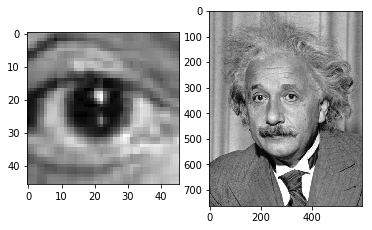

In [1]:
from skimage import io
from skimage.color import rgb2gray
from matplotlib import pyplot as plt
from skimage.feature import match_template
import numpy as np
from scipy.ndimage import convolve
from skimage.transform import rotate
%matplotlib inline

plt.subplot(1,2,1)
eye=io.imread('./images/eye.png')
eye = rgb2gray(eye)
plt.imshow(eye,cmap='gray')

plt.subplot(1,2,2)
einstein=io.imread('./images/einstein.png')
einstein = rgb2gray(einstein)
plt.imshow(einstein,cmap='gray')

plt.show()

def plot_images_with_titles(images,titles):
    figure, ax = plt.subplots(ncols=len(images),figsize=(10,10))
    for i in range(len(images)):
        ax[i].imshow(images[i],cmap='gray')
        ax[i].title.set_text(titles[i])
    plt.show()
        

In [2]:
''' Visualization and template matching functions definition '''
def ssd(image,template):
    match_im = np.ones(image.shape)#ssd final image
    #getting image and template size for move a sub-window
    k,l = image.shape
    m,n = template.shape
    #moving thorugh image with sub-window
    for i in range(k):
        for j in range(l):
            if i+m <= k and j+n <= l:#not passing more than window
                match_im[i:i+m,j:j+n]  = np.linalg.norm(np.abs(image[i:i+m,j:j+n]-template))#euclidean dist
    return match_im
            
            
    
    

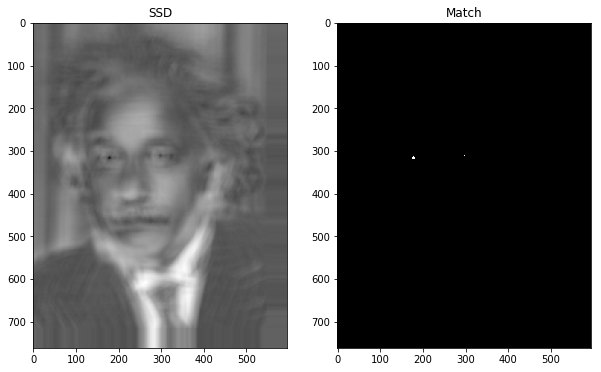

In [3]:
images = []
template_match = ssd(einstein,eye)
template_match /= np.max(template_match)#normalize
images.append(template_match)

tmp = template_match.copy()
tmp[tmp > np.min(tmp)+0.251] = 1 #aplying patch to get points
b = np.where(tmp != 1)#black `points(match)
w = np.where(tmp == 1)#rest
tmp[b] = 1#invert black to white
tmp[w] = 0#invert white to black
images.append(tmp)

plot_images_with_titles(images,["SSD","Match"])

C:\Users\yusepp\Anaconda3\lib\site-packages\mkl_fft\_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\template.py:180: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return response[slices]


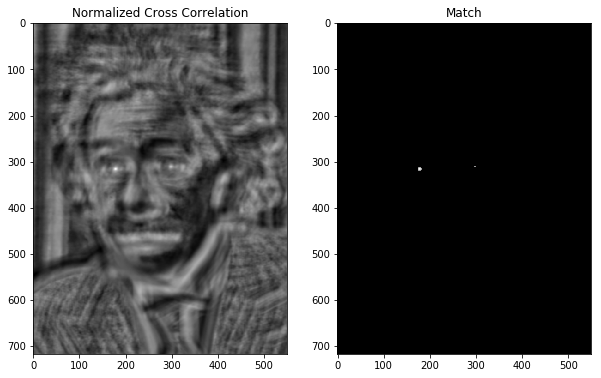

In [4]:
images = []
template_match = match_template(einstein,eye)#NCC
images.append(template_match)

tmp = template_match.copy()
tmp[tmp < np.max(tmp)-0.45] = 0#applying mask to visualize match
images.append(tmp)

plot_images_with_titles(images,["Normalized Cross Correlation","Match"])

4.1.2 How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)? To this purpose, read the images "einstein_br.png" and "einstein_mask.png".

Visualize the normalized cross-correlation image between the template and the image as well as this very same image in a binarized form in order to show where is the minimal distance between the template and the image. 
* How does the minimum distance between the template and the image change? 
* What are the minimal distance pixels in the correlation images? 
* What are the distances between the template and the image around the eyes of the image? 

Use titles of the figures to explain what is displayed.


# Answering:

The template is like a mask that applies a convulation to the image, with the maximum response at the correct place(match) and thats the minimum distance between template and image(it must be 0 or so close).

I also found that mask with the 0.45 offset didnt work really well so I changed but it detects some false positives. That shouldnt be happening since NCC is less sensitive to those changes

C:\Users\yusepp\Anaconda3\lib\site-packages\mkl_fft\_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\template.py:180: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return response[slices]


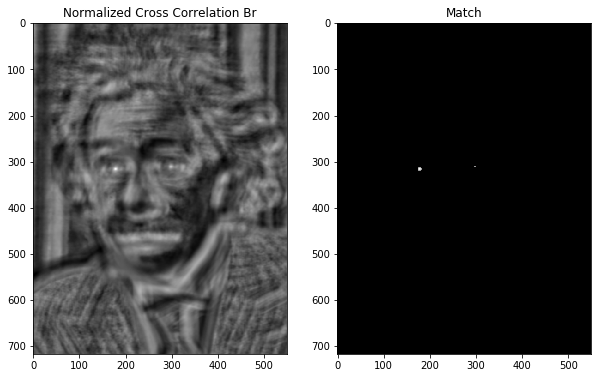

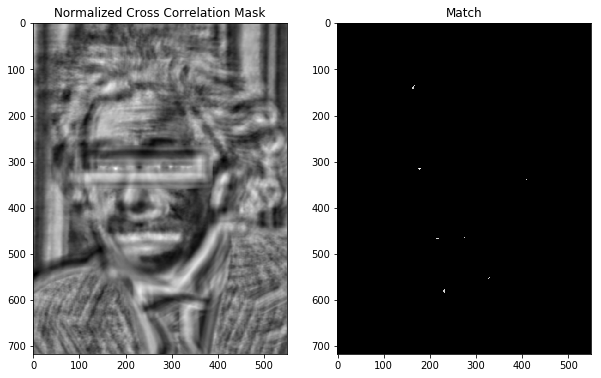

In [5]:
images = []

einstein_br=io.imread('./images/einstein_br.png')
einstein_br = rgb2gray(einstein_br)

einstein_mask=io.imread('./images/einstein_mask.png')
einstein_mask = rgb2gray(einstein_mask)
######################################################################################
#einstein br
template_match_1 = match_template(einstein_br,eye)
images.append(template_match_1)

tmp_1 = template_match_1.copy()
tmp_1[tmp_1 < np.max(tmp_1)-0.45] = 0
images.append(tmp_1)

plot_images_with_titles(images,["Normalized Cross Correlation Br","Match"])
######################################################################################
images = []
#eintein mask
template_match_2 = match_template(einstein_mask,eye)
images.append(template_match_2)

tmp_2 = template_match_2.copy()
tmp_2[tmp_2 < np.max(tmp_2)-0.12] = 0
images.append(tmp_2)

plot_images_with_titles(images,["Normalized Cross Correlation Mask","Match"])
######################################################################################

4.1.3 How does the result of the template matching changes if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the 'eye_br.png' template.

# Answering
NCC should be the method that is less sensitive to contrast change or even some transformations.
From my results we got that even changing the contrast in eyes the result is the same

C:\Users\yusepp\Anaconda3\lib\site-packages\mkl_fft\_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\template.py:180: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return response[slices]


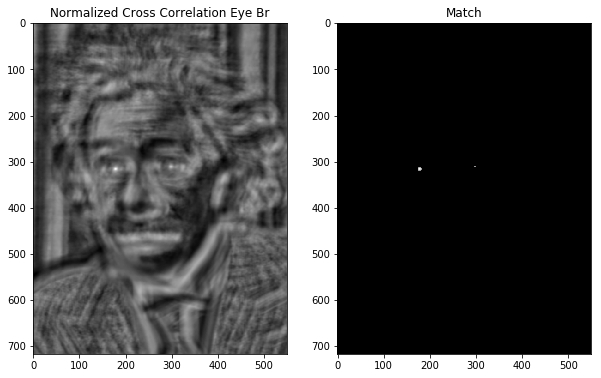

In [6]:
images = []
#eye br
eye_br=io.imread('./images/eye_br.png')
eye_br = rgb2gray(eye_br)

template_match = match_template(einstein,eye_br)
images.append(template_match)

tmp = template_match.copy()
tmp[tmp < np.max(tmp)-0.45] = 0
images.append(tmp)

plot_images_with_titles(images,["Normalized Cross Correlation Eye Br","Match"])


4.1.4 Check how the result changes if the template is rotated. Visualize the template and its rotation by 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation.
Help: use the function rotate() in skimage.transform

Comment what is the template matching process, what advantages and disadvantages it has, how sensible is to image deformation in photometric and spatial dimensions, what parameters it has and which measure for image comparisons works better.

# Answering
NCC makes a decent work here , I mean it's not an correct positive but it doesnt mess up the match image and even 1 eye is always detected

SSD otherwise, is broken with rotation , match is messed.

C:\Users\yusepp\Anaconda3\lib\site-packages\mkl_fft\_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\template.py:180: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return response[slices]


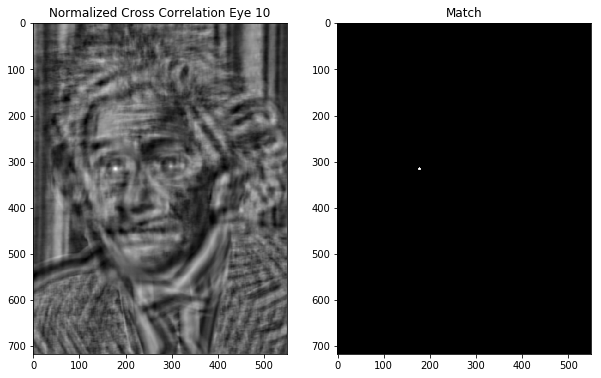

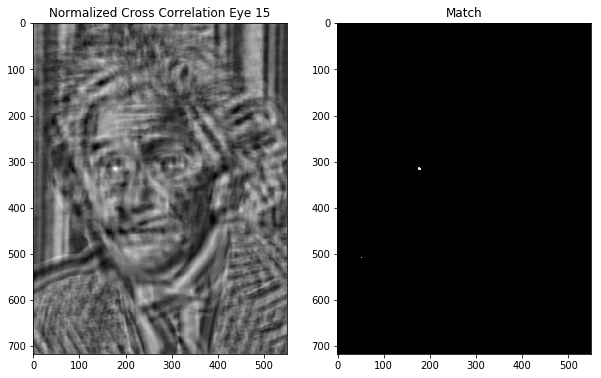

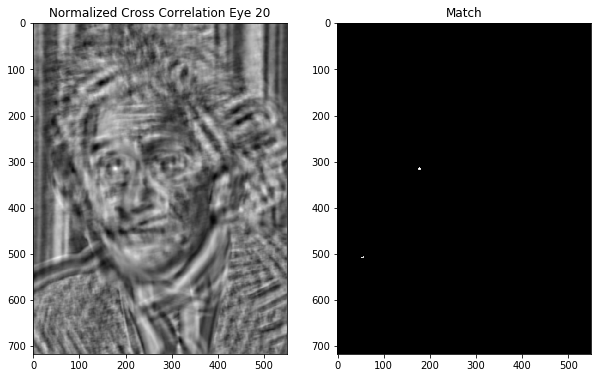

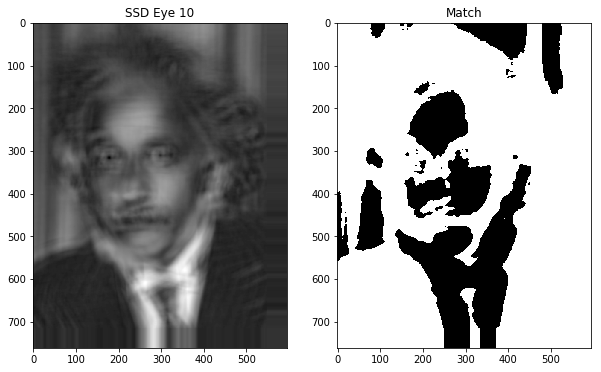

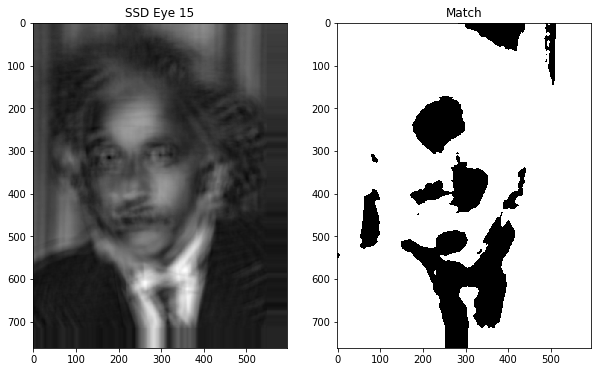

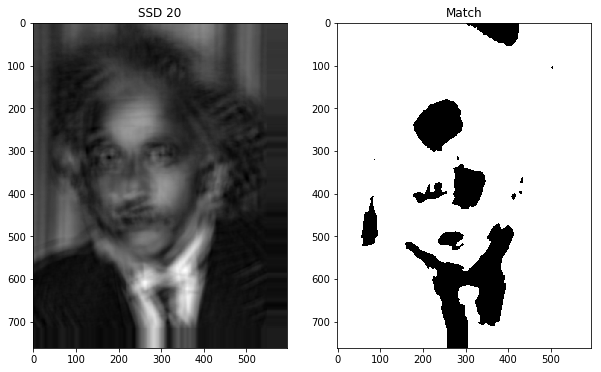

In [7]:
eye_10 = rotate(eye,10)#Rotations
eye_15 = rotate(eye,15)
eye_20 = rotate(eye,20)
######################################################################################
images = []
#NCC EYE10
template_match = match_template(einstein,eye_10)
images.append(template_match)

tmp = template_match.copy()
tmp[tmp < np.max(tmp)-0.15] = 0
images.append(tmp)

plot_images_with_titles(images,["Normalized Cross Correlation Eye 10","Match"])
######################################################################################
images = []
#NCC EYE15
template_match = match_template(einstein,eye_15)
images.append(template_match)

tmp = template_match.copy()
tmp[tmp < np.max(tmp)-0.15] = 0
images.append(tmp)

plot_images_with_titles(images,["Normalized Cross Correlation Eye 15","Match"])
######################################################################################
images = []
#NCC EYE20
template_match = match_template(einstein,eye_20)
images.append(template_match)

tmp = template_match.copy()
tmp[tmp < np.max(tmp)-0.1] = 0
images.append(tmp)

plot_images_with_titles(images,["Normalized Cross Correlation Eye 20","Match"])
######################################################################################
images = []
#SSD EYE10
template_match = ssd(einstein,eye_10)
template_match /= np.max(template_match)#normalize
images.append(template_match)

tmp = template_match.copy()
tmp[tmp > np.min(tmp)+0.251] = 1 #aplying patch to get points
b = np.where(tmp != 1)#black `points(match)
w = np.where(tmp == 1)#rest
tmp[b] = 1#invert black to white
tmp[w] = 0#invert white to black
images.append(tmp)

plot_images_with_titles(images,["SSD Eye 10","Match"])
######################################################################################
images = []
#SSD EYE15
template_match = ssd(einstein,eye_15)
template_match /= np.max(template_match)#normalize
images.append(template_match)

tmp = template_match.copy()
tmp[tmp > np.min(tmp)+0.251] = 1 #aplying patch to get points
b = np.where(tmp != 1)#black `points(match)
w = np.where(tmp == 1)#rest
tmp[b] = 1#invert black to white
tmp[w] = 0#invert white to black
images.append(tmp)

plot_images_with_titles(images,["SSD Eye 15","Match"])
######################################################################################
images = []
#SSD EYE20
template_match = ssd(einstein,eye_20)
template_match /= np.max(template_match)#normalize
images.append(template_match)

tmp = template_match.copy()
tmp[tmp > np.min(tmp)+0.251] = 1 #aplying patch to get points
b = np.where(tmp != 1)#black `points(match)
w = np.where(tmp == 1)#rest
tmp[b] = 1#invert black to white
tmp[w] = 0#invert white to black
images.append(tmp)

plot_images_with_titles(images,["SSD 20","Match"])
######################################################################################

# 4.2 Histogram of Oriented Gradients


The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image 'car_template.png' and the folder 'cars', apply the HOG descriptor in order to detect where there is a car in the images in the folder 'car'. To this purpose, apply the "sliding window" technique. The algorithm can be:

a) Read the car template ('car_template.png') and obtain its HOG descriptor. Visualize it. [Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py) 

b) Read images from the folder "car", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the car template. 

c) Visualize the location in the image that is the most similar to the car template. What distance will you use to compare both HOG descriptors of the car template and the image region? Compare if there is any difference in their results. 

d) Compute in how many images the cars were detected correctly and discuss the algorithm failures. What do you think can be the reasons for the failure?

Hint: the HOG detector function is in the skimage.feature library. 

If you want to accelerate algorithm execution, you can apply the sliding window with a step of X pixels (e.g. X=5).

Discuss what is the HOG descriptor, what are the parameters of the algorithm, which are the optimal values for the car detection testing several values of the parameters up to your criterion. Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).


# Answering
HOG is the Histogram of gradient, is good because is based on direction so even though illumination changes magnitude, it wont change our direction.

Based on my testings the parameters to play are orientations=8, pixels_per_cell=(8, 16),cells_per_block=(2, 2)(those are my values from my exprience)

Compared to template based is a more robust descriptor(as I mentioned with illumination/contrast changes). But is sensitive to image transformations like rotations.



In [8]:
''' Visualization and HOG functions definition '''
from skimage.feature import hog
car = io.imread("images/car_template.png")#car template
car = rgb2gray(car)
seq = io.ImageCollection('images/TestImages/*')#car set
h_car,im_car = hog(car,orientations=9, pixels_per_cell=(8, 16),#testing hog
                    cells_per_block=(2, 2), visualize=True)

C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)


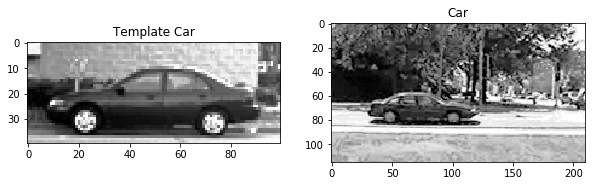

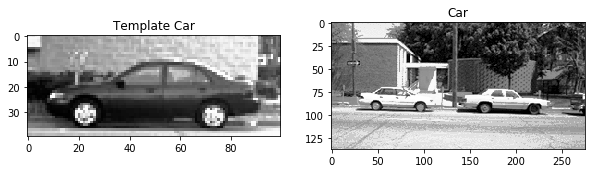

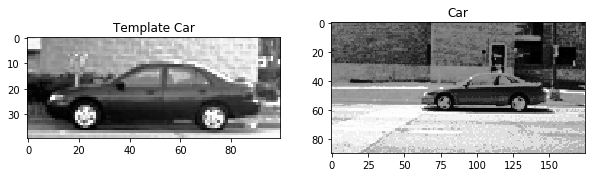

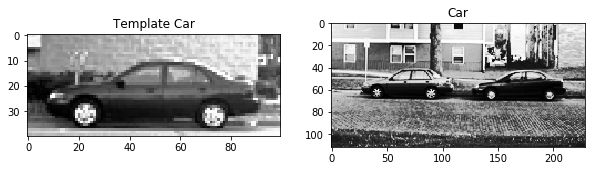

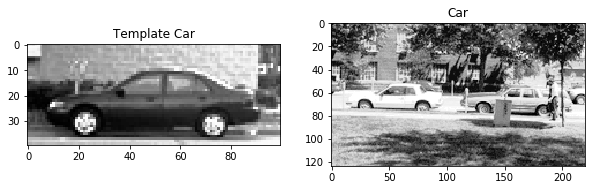

...

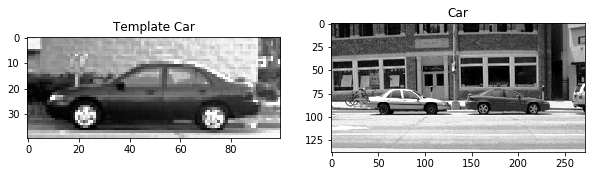

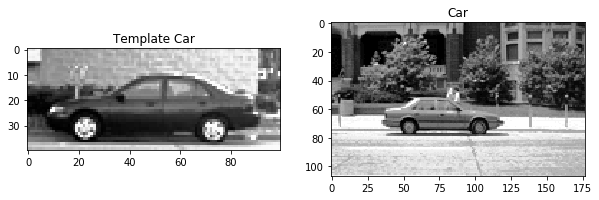

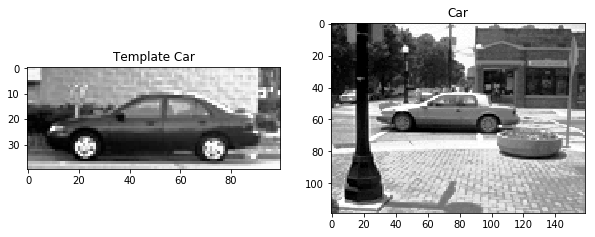

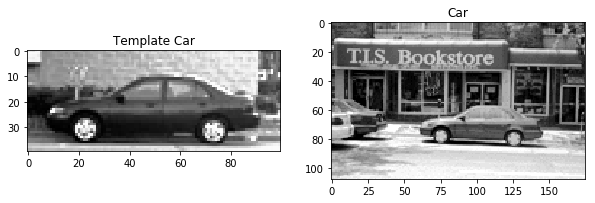

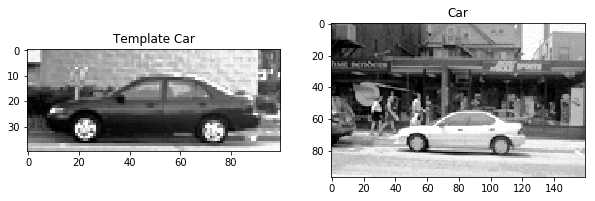

In [9]:
#plot every car
for c in seq:
    c_gray = rgb2gray(c)
    plot_images_with_titles([car,c_gray],["Template Car","Car"])

C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)


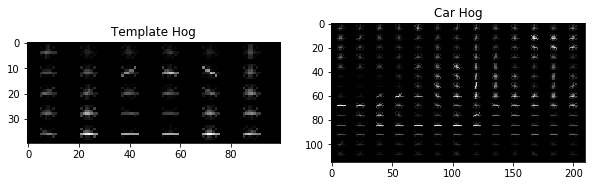

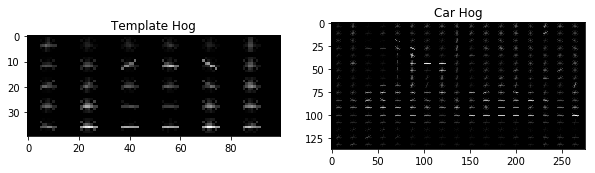

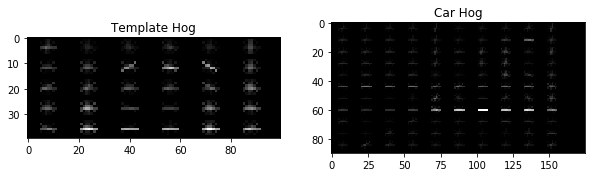

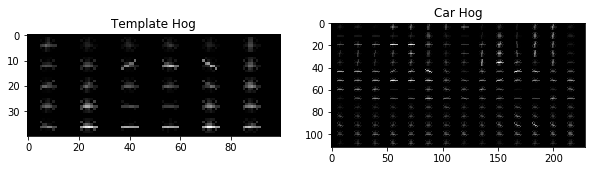

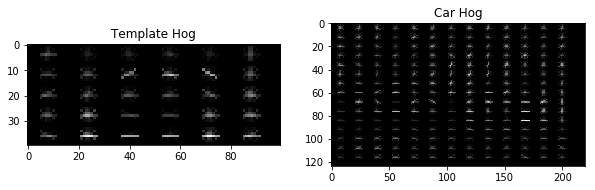

...

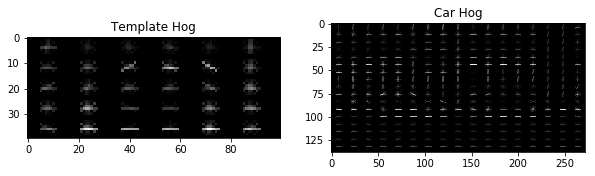

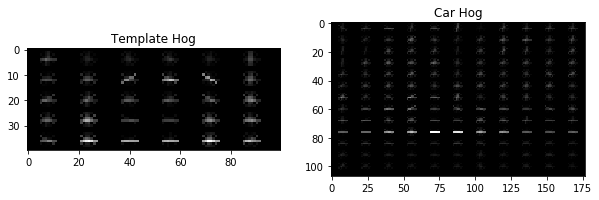

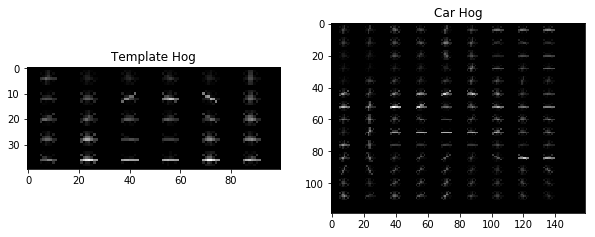

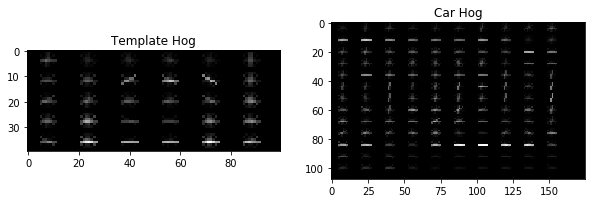

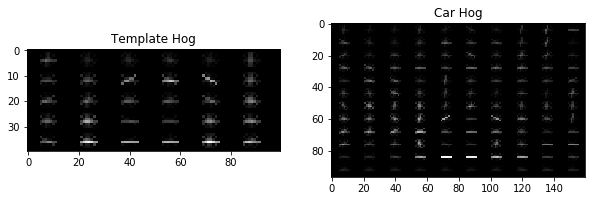

In [10]:
#plot every hog
for c in seq:
    c_gray = rgb2gray(c)
    h,im = hog(c_gray,orientations=9, pixels_per_cell=(8, 16),
                    cells_per_block=(2, 2), visualize=True)
    plot_images_with_titles([im_car,im],["Template Hog","Car Hog"])
    

In [11]:
def compare_template(image,template):
    #getting image and template size for move a sub-window
    k,l = image.shape
    m,n = template.shape
    best = (float('inf'),None)
    h_car = hog(template,orientations=8, pixels_per_cell=(8, 16),cells_per_block=(2, 2))
    #moving thorugh image with sub-window
    for i in range(0,k,5):
        for j in range(0,l,5):
            if i+m <= k and j+n <= l:#not passing more than window
                window = image[i:i+m,j:j+n]
                h = hog(window,orientations=8, pixels_per_cell=(8, 16),cells_per_block=(2, 2))
                dist = np.linalg.norm(np.abs(h-h_car))
                best = min(best,(dist,window))
    return best

def most_similar(db,search):
    best = (float('inf'),None,None)
    for c in db:#every image
        c_gray = rgb2gray(c)
        comparison = compare_template(c,search)#compare image with a template
        best = min(best,(comparison[0],comparison[1],c_gray))#keep the best option
    return best
    


C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)


Found at distance: 0.5479895486431564


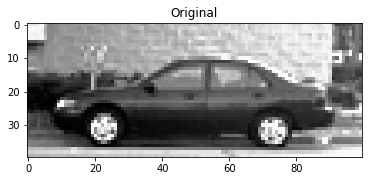

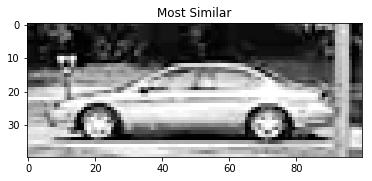

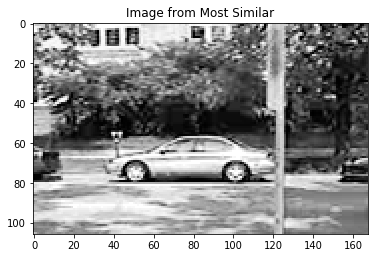

In [12]:
#plot
sim = most_similar(seq,car)
print("Found at distance: "+str(sim[0]))
plt.title("Original")
plt.imshow(car,cmap='gray')
plt.show()
plt.title("Most Similar")
plt.imshow(sim[1],cmap='gray')
plt.show()
plt.title("Image from Most Similar")
plt.imshow(sim[2],cmap='gray')
plt.show()

In [13]:
def check_image(image,template,th):
    #getting image and template size for move a sub-window
    k,l = image.shape
    m,n = template.shape

    h_car = hog(template,orientations=8, pixels_per_cell=(8, 16),cells_per_block=(2, 2))
    #moving thorugh image with sub-window
    for i in range(0,k,5):
        for j in range(0,l,5):
            if i+m <= k and j+n <= l:#not passing more than window
                window = image[i:i+m,j:j+n]
                h = hog(window,orientations=8, pixels_per_cell=(8, 16),cells_per_block=(2, 2))
                dist = np.linalg.norm(np.abs(h-h_car))
                if dist < th:#th based on the maximum distance we consider a positive
                    return 1 #found!
    return 0#not found

def accuracy(db,search,th):
    count = 0
    for c in db:
        c_gray = rgb2gray(c)
        count += check_image(c,search,th)#is there a car in this image
    return 100*(count/len(db))#%of accuracy
    
accuracy(seq,car,0.8)#if we consider <0.8 all positives

C:\Users\yusepp\Anaconda3\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)


91.17647058823529

# 4.3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems: 
- feature location, 
- image feature description.

In theory classes, we saw two feature extraction methods: SIFT and ORB. Let us focus on ORB.

**4.3.1** Check if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images. 

a) Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks6.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) above. Define the algorithm in terms of functions in order to be able to apply it on different images. Comment the code in detail.

Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.

In [14]:
''' Visualization and ORB functions definition '''
from skimage.feature import (match_descriptors, corner_harris,corner_peaks, ORB, plot_matches)
from skimage import transform as tf
#reading images
starbucks = io.imread("images/starbucks.jpg")
starbucks = rgb2gray(starbucks)
starbucks_6 = io.imread("images/starbucks6.jpg")
starbucks_6 = rgb2gray(starbucks_6)

descriptor_extractor = ORB(n_keypoints=200)#creating extactor
#starbucks
descriptor_extractor.detect_and_extract(starbucks)#extracting
keypoints1 = descriptor_extractor.keypoints #keypoints
descriptors1 = descriptor_extractor.descriptors#descriptors
#same but for starbucks_6
descriptor_extractor.detect_and_extract(starbucks_6)
keypoints2 = descriptor_extractor.keypoints
descriptors2 = descriptor_extractor.descriptors
#we generate matches
matches = match_descriptors(descriptors1, descriptors2, cross_check=True)



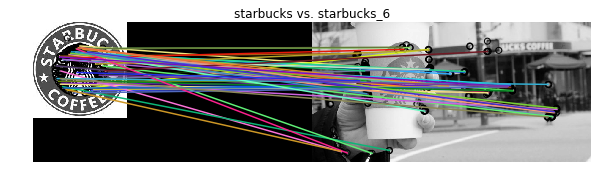

In [15]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(10,10))
plt.gray()
#ploting
plot_matches(ax, starbucks, starbucks_6, keypoints1, keypoints2, matches)
ax.axis('off')
ax.set_title("starbucks vs. starbucks_6")
plt.show()

b) Repeate the experiment comparing the "starbucks.jpg" image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when the algorithm works best. 

In [16]:
seq = io.ImageCollection('images/starbucks*')#read all starbucks images

descriptor_extractor = ORB(n_keypoints=200)#creating extractor

keypoints = []
matches = []
images = []
for image in seq:
    im = rgb2gray(image)#gray
    if not np.array_equal(im,starbucks):#we save keypoints,matches and images
        images.append(im)
        descriptor_extractor.detect_and_extract(im)
        keypoints.append(descriptor_extractor.keypoints)
        descriptors = descriptor_extractor.descriptors
        matches.append(match_descriptors(descriptors1, descriptors, cross_check=True))


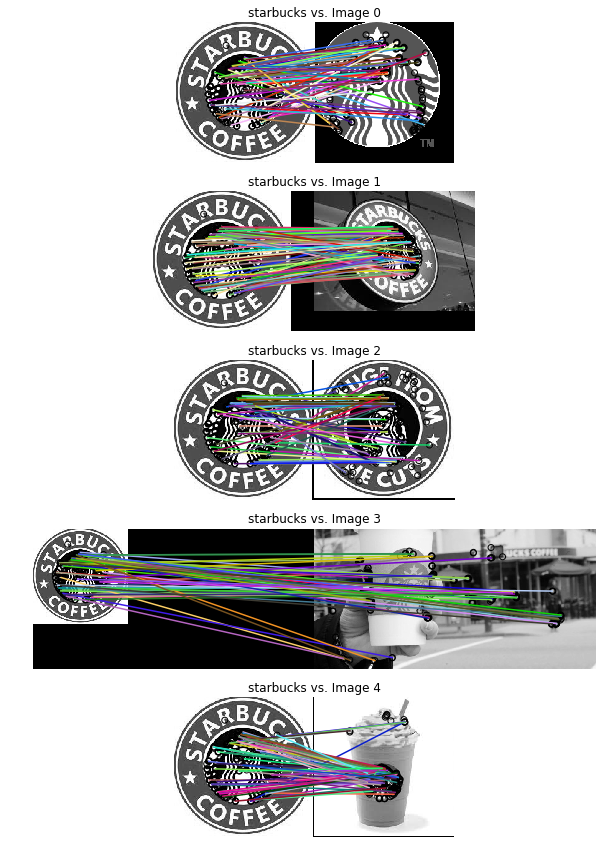

In [17]:
fig, ax = plt.subplots(nrows=len(keypoints), ncols=1,figsize=(15,15))
plt.gray()
#plot every comparison with starbucks
for i in range(len(keypoints)):
    plot_matches(ax[i], starbucks, images[i], keypoints1, keypoints[i], matches[i])
    ax[i].axis('off')
    ax[i].set_title("starbucks vs. Image %d" %i)
plt.show()

c) Repeate the experiment in (b): 
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform 
- Change the scale and orientation of the scene image and compare it with the model image.

Help: To do so, you can use the function given below as example:

import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)

or

tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(image2transform, tform)

In [18]:
seq = io.ImageCollection('images/starbucks*')#again all images in starbucks

descriptor_extractor = ORB(n_keypoints=200)#creating extractor

keypoints = []
matches = []
images = []
for image in seq:
    #2gray and 180
    im = rgb2gray(image)
    im_180 = tf.rotate(im, 180)
    images.append((im,im_180))
    #fields of original
    descriptor_extractor.detect_and_extract(im)
    k1 = descriptor_extractor.keypoints
    d1 = descriptor_extractor.descriptors
    #fields of 180º
    descriptor_extractor.detect_and_extract(im_180)
    k2 = descriptor_extractor.keypoints
    d2 = descriptor_extractor.descriptors
    #insert keypoints and matches
    keypoints.append((k1,k2))
    matches.append(match_descriptors(d1, d2, cross_check=True))
    
    


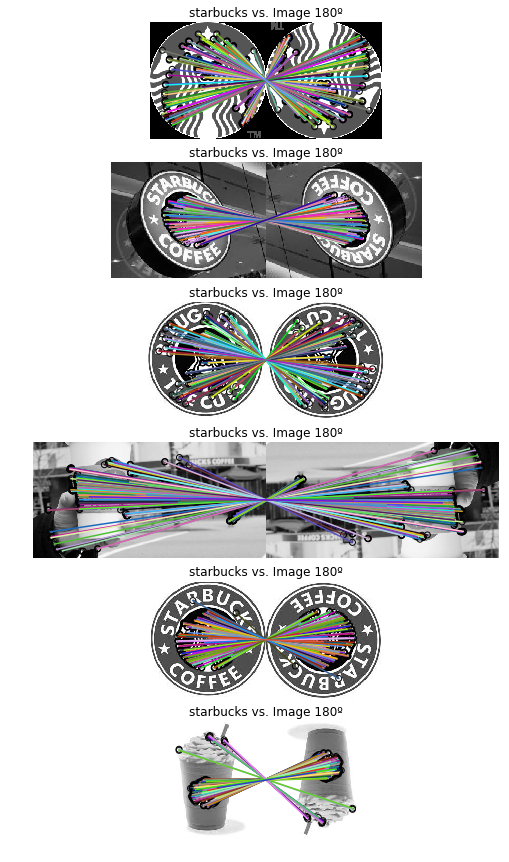

In [19]:
fig, ax = plt.subplots(nrows=len(keypoints), ncols=1,figsize=(15,15))
plt.gray()
#plot every image and his 180ª
for i in range(len(keypoints)):
    plot_matches(ax[i], images[i][0], images[i][1], keypoints[i][0], keypoints[i][1], matches[i])
    ax[i].axis('off')
    ax[i].set_title("starbucks vs. Image 180º")
plt.show()

In [20]:
seq = io.ImageCollection('images/Coke/*')#again all images in starbucks

descriptor_extractor = ORB(n_keypoints=200)#creating extractor

keypoints = []
matches = []
images = []
for image in seq:
    #2gray and 180
    im = rgb2gray(image)
    im_180 = tf.rotate(im, 180)
    images.append((im,im_180))
    #fields of original
    descriptor_extractor.detect_and_extract(im)
    k1 = descriptor_extractor.keypoints
    d1 = descriptor_extractor.descriptors
    #fields of 180º
    descriptor_extractor.detect_and_extract(im_180)
    k2 = descriptor_extractor.keypoints
    d2 = descriptor_extractor.descriptors
    #insert keypoints and matches
    keypoints.append((k1,k2))
    matches.append(match_descriptors(d1, d2, cross_check=True))

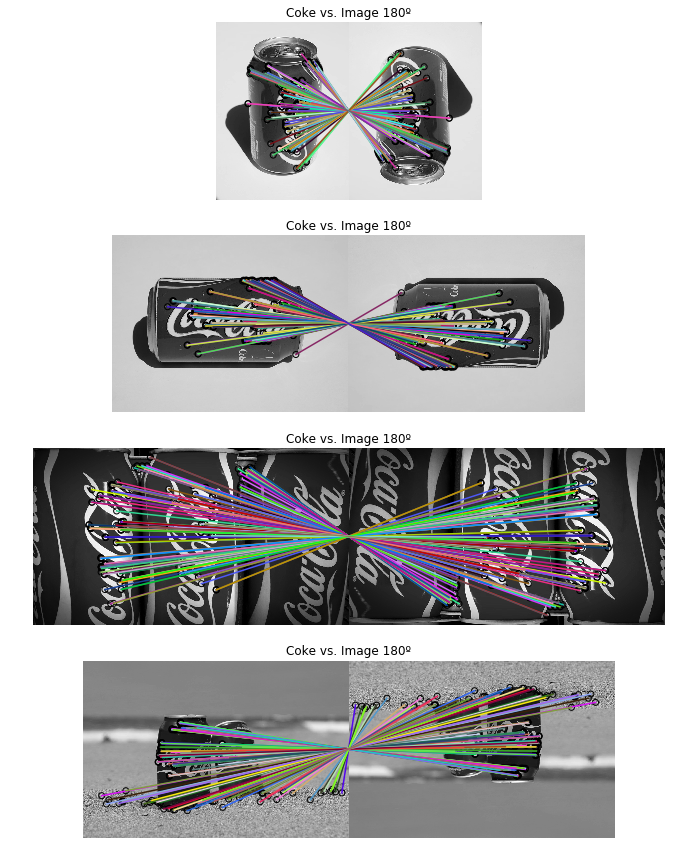

In [23]:
fig, ax = plt.subplots(nrows=len(keypoints), ncols=1,figsize=(15,15))
plt.gray()
#plot every image and his 180ª
for i in range(len(keypoints)):
    plot_matches(ax[i], images[i][0], images[i][1], keypoints[i][0], keypoints[i][1], matches[i])
    ax[i].axis('off')
    ax[i].set_title("Coke vs. Image 180º")
plt.show()

**Optional:** Repeate the experiment with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.



### Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo? 

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it) 

# Answer
Orb descriptor is good because is fast,efficient and allows a real time matching even with low power
Wihtout the logo we should expect no common keypoints or a really small few(margin of error)
A measure using the ORB would be measuring how many keypoints found a match of the total or even if a point found a match trying to mix with other match like comparing both points and make an NCC or SSD to see if they are a bit different or not.

## Delivery

All code sould be commented in English. Answers of the questions should be given in English too.

Compressed file **P4_Student1_Student2.zip** that includes:
- The notebook P1_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
- The images used that are not provided in P1.zip.

**Deadline (Campus Virtual): November 26th, 23:59.** 

In [22]:
#Appendix: In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)